## About the Problem:
 Fires and smoke outbreaks pose significant threats to life and property. Early detection is crucial for preventing disasters and enabling a rapid response. Traditional fire detection methods rely on sensors, which may not be sufficient in open environments. Computer vision-based fire and smoke detection offers a real-time solution by leveraging deep learning models.

This project aims to develop an object detection system that can identify smoke and fire in images and videos using YOLOv8.

## Dataset Details:
This dataset consists of over 21,000 images with annotated bounding boxes for smoke and fire detection. The dataset is divided into training, validation, and test sets, making it suitable for developing real-time fire detection models.

Dataset Statistics:

Fire: 14,692 bounding boxes

Smoke: 11,865 bounding boxes

Total Images: 21,000+

Classes:

0 → Smoke

1 → Fire

## Step 1: Import Libraries

In [2]:
!pip install ultralytics


In [3]:
from ultralytics import YOLO


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
import os, cv2, yaml, random
import numpy as np
from glob import glob
from PIL import Image
import matplotlib.pyplot as plt


## Step 2: Load and Visualize the Data

TRAIN DATASET SAMPLES:


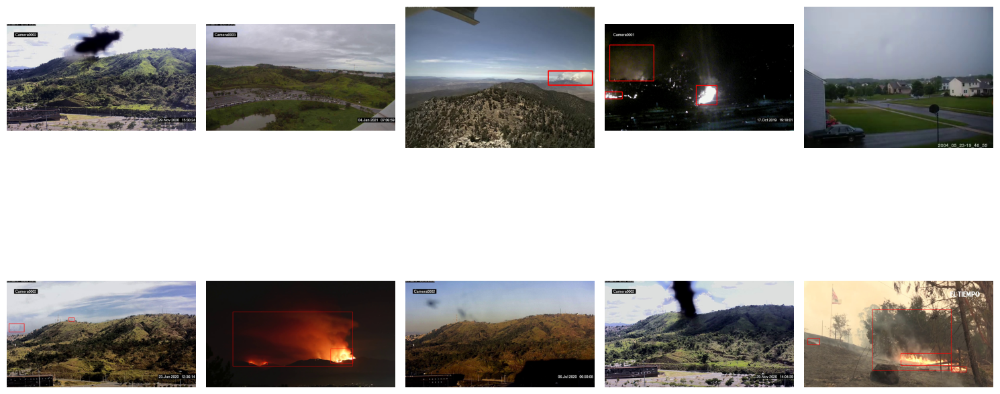

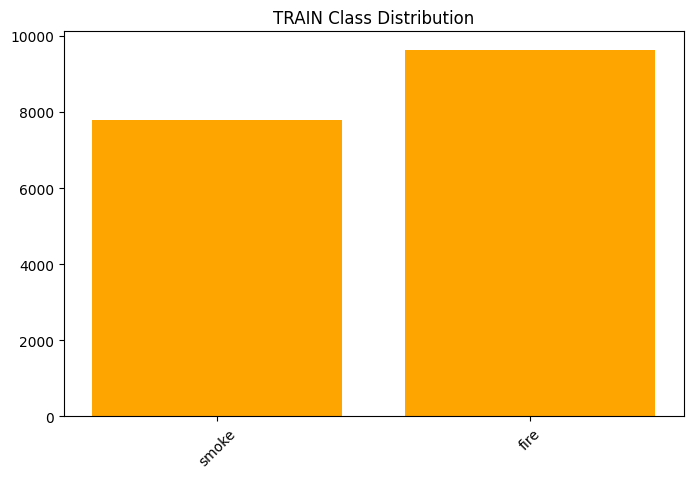

TEST DATASET SAMPLES:


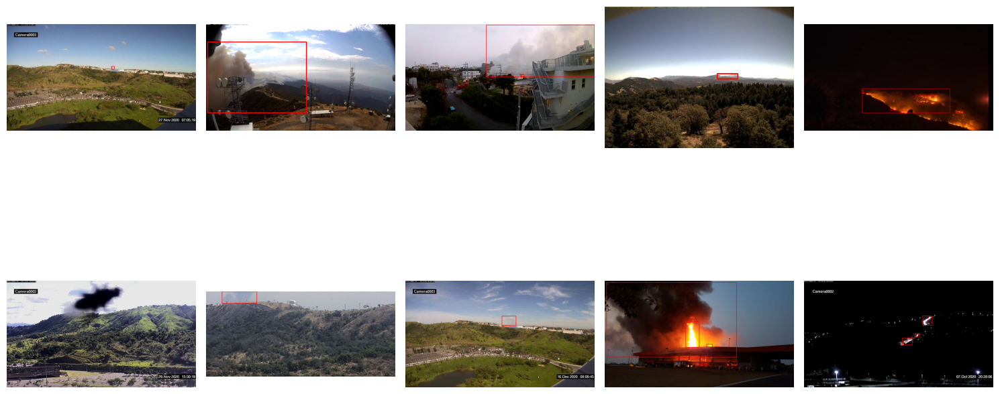

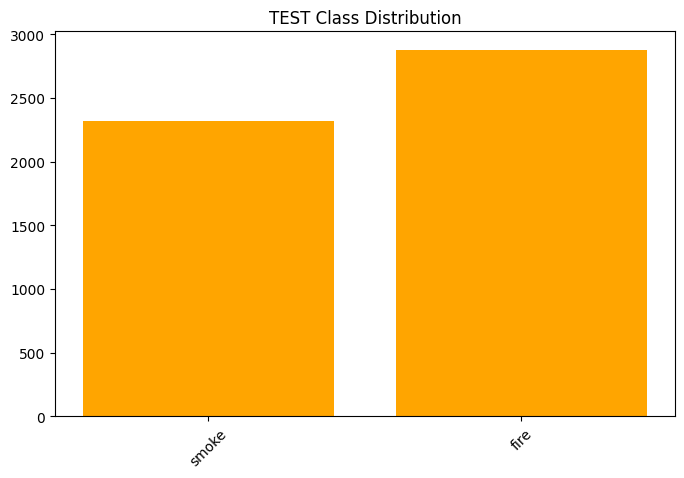

VAL DATASET SAMPLES:


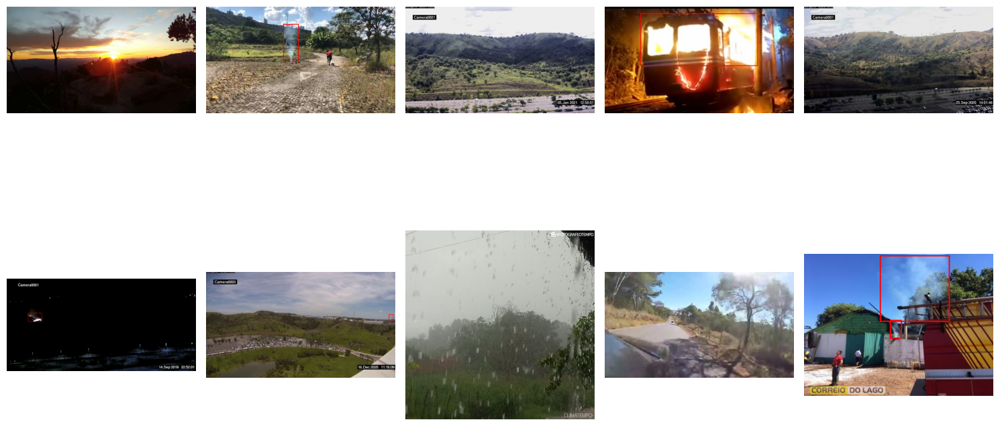

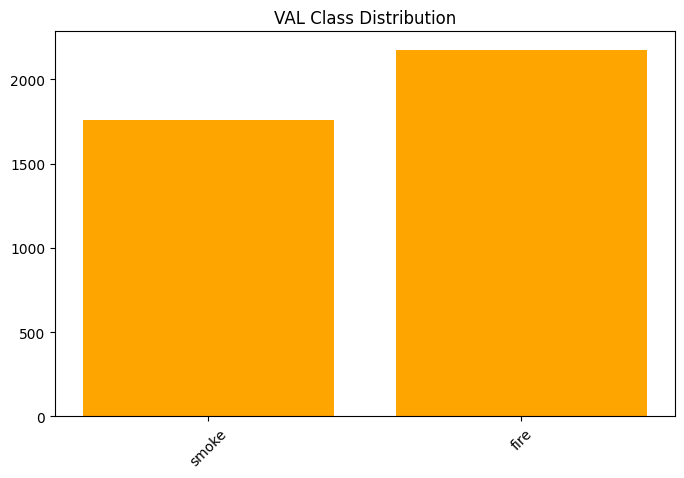

In [5]:
class SmokeFireVisualizer:
    def __init__(self, root, data_types, n_ims=10, rows=2):
        self.root = root
        self.data_types = data_types
        self.n_ims = n_ims
        self.rows = rows
        self.class_dict = self.load_class_names()

    def load_class_names(self):
        try:
            with open(f"{self.root}/data.yaml", 'r') as file:
                return yaml.safe_load(file)['names']
        except FileNotFoundError:
            print("Error: data.yaml file not found.")
            return []

    def load_data(self, data_type):
        image_paths = glob(f"{self.root}/data/{data_type}/images/*.jpg")
        labels = [p.replace("images", "labels").replace(".jpg", ".txt") for p in image_paths]
        return list(zip(image_paths, labels))

    def visualize_images(self, data_type):
        data = self.load_data(data_type)
        sample_size = min(len(data), self.n_ims)
        plt.figure(figsize=(15, 10))

        for i, (img_path, lbl_path) in enumerate(random.sample(data, sample_size)):
            plt.subplot(self.rows, self.n_ims // self.rows, i + 1)
            image = np.array(Image.open(img_path).convert("RGB"))
            bboxes = self.load_bboxes(lbl_path, image.shape)
            
            for bbox in bboxes:
                x_min, y_min, x_max, y_max = bbox[1:]
                cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
            
            plt.imshow(image)
            plt.axis('off')
        plt.tight_layout()
        plt.show()

    def load_bboxes(self, lbl_path, img_shape):
        h, w = img_shape[:2]
        bboxes = []
        try:
            with open(lbl_path, 'r') as f:
                for line in f.readlines():
                    cls_id, x_c, y_c, bw, bh = map(float, line.strip().split())
                    x_min, y_min = int((x_c - bw / 2) * w), int((y_c - bh / 2) * h)
                    x_max, y_max = int((x_c + bw / 2) * w), int((y_c + bh / 2) * h)
                    bboxes.append((cls_id, x_min, y_min, x_max, y_max))
        except FileNotFoundError:
            print(f"Warning: Missing label file for {lbl_path}")
        return bboxes

    def class_distribution(self, data_type):
        class_counts = {cls: 0 for cls in self.class_dict}
        for _, lbl_path in self.load_data(data_type):
            try:
                with open(lbl_path, 'r') as f:
                    for line in f.readlines():
                        cls_id = int(line.strip().split()[0])
                        class_counts[self.class_dict[cls_id]] += 1
            except FileNotFoundError:
                continue

        plt.figure(figsize=(8, 5))
        plt.bar(class_counts.keys(), class_counts.values(), color='orange')
        plt.xticks(rotation=45)
        plt.title(f"{data_type.upper()} Class Distribution")
        plt.show()

print("TRAIN DATASET SAMPLES:")
visualizer.visualize_images("train")
visualizer.class_distribution("train")
print("TEST DATASET SAMPLES:")
visualizer.visualize_images("test")
visualizer.class_distribution("test")
print("VAL DATASET SAMPLES:")
visualizer.visualize_images("val")
visualizer.class_distribution("val")

## Step 3: YAML File Configuration

In [6]:
import yaml

# Load YAML content into a Python dictionary
yml_file_path = "/kaggle/input/smoke-fire-detection-yolo/data.yaml"

with open(yml_file_path, 'r') as file:
    data = yaml.safe_load(file)

# Correct dataset path for YOLO compatibility
data['path'] = '/kaggle/input/smoke-fire-detection-yolo'
data['train'] = 'data/train/images'
data['val'] = 'data/val/images'
data['test'] = 'data/test/images'

print(data)

# Save the updated YAML content to a file
output_path = '/kaggle/working/updated_data.yml'
with open(output_path, 'w') as file:
    yaml.dump(data, file, default_flow_style=False)


{'path': '/kaggle/input/smoke-fire-detection-yolo', 'train': 'data/train/images', 'val': 'data/val/images', 'test': 'data/test/images', 'names': ['smoke', 'fire'], 'nc': 2, 'train_count': 14122, 'val_count': 3099, 'test_count': 4306}


## Step 4: Model Training

In [7]:
# Load YOLOv8 model (pre-trained)
model = YOLO('yolov8n.pt') 

# Train the model with the updated YAML path
results = model.train(
    data='/kaggle/working/updated_data.yml', 
    epochs=50, 
    imgsz=640
)

100%|██████████| 6.25M/6.25M [00:00<00:00, 110MB/s]


Ultralytics 8.3.94 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/updated_data.yml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_con

100%|██████████| 755k/755k [00:00<00:00, 24.9MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 130MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/smoke-fire-detection-yolo/data/train/labels... 14101 images, 6457 backgrounds, 21 corrupt: 100%|██████████| 14122/14122 [00:42<00:00, 334.14it/s]

train: WARNING ⚠️ /kaggle/input/smoke-fire-detection-yolo/data/train/images/WEB02521.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/smoke-fire-detection-yolo/data/train/images/WEB02521.jpg'
train: WARNING ⚠️ /kaggle/input/smoke-fire-detection-yolo/data/train/images/WEB06626.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/smoke-fire-detection-yolo/data/train/images/WEB06626.jpg'
train: WARNING ⚠️ /kaggle/input/smoke-fire-detection-yolo/data/train/images/WEB07199.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/smoke-fire-detection-yolo/data/train/images/WEB07199.jpg'
train: WARNING ⚠️ /kaggle/input/smoke-fire-detection-yolo/data/train/images/WEB07271.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/smoke-fire-detection-yolo/data/train/images/WEB07271.jpg'
train: WARNING ⚠️ /kaggle/input/smoke-fire-detection-yolo/data/train/images/WEB07278.jpg: ig

train: WARNING ⚠️ Cache directory /kaggle/input/smoke-fire-detection-yolo/data/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/input/smoke-fire-detection-yolo/data/val/labels... 3094 images, 1375 backgrounds, 5 corrupt: 100%|██████████| 3099/3099 [00:09<00:00, 337.26it/s]

val: WARNING ⚠️ /kaggle/input/smoke-fire-detection-yolo/data/val/images/WEB07535.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/smoke-fire-detection-yolo/data/val/images/WEB07535.jpg'
val: WARNING ⚠️ /kaggle/input/smoke-fire-detection-yolo/data/val/images/WEB07536.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/smoke-fire-detection-yolo/data/val/images/WEB07536.jpg'
val: WARNING ⚠️ /kaggle/input/smoke-fire-detection-yolo/data/val/images/WEB07539.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/smoke-fire-detection-yolo/data/val/images/WEB07539.jpg'
val: WARNING ⚠️ /kaggle/input/smoke-fire-detection-yolo/data/val/images/WEB07542.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/smoke-fire-detection-yolo/data/val/images/WEB07542.jpg'
val: WARNING ⚠️ /kaggle/input/smoke-fire-detection-yolo/data/val/images/WEB07561.jpg: ignoring corrupt image/label: 

val: WARNING ⚠️ Cache directory /kaggle/input/smoke-fire-detection-yolo/data/val is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.23G      1.632      2.943      1.524         10        640: 100%|██████████| 882/882 [02:49<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:16<00:00,  6.03it/s]


                   all       3094       3917      0.496       0.41      0.397      0.184

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.52G       1.65      2.142      1.503         18        640: 100%|██████████| 882/882 [02:43<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.03it/s]


                   all       3094       3917      0.407      0.369      0.313       0.14

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.52G       1.73      2.003       1.57         14        640: 100%|██████████| 882/882 [02:41<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.17it/s]


                   all       3094       3917      0.374      0.348      0.283      0.111

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.52G      1.775      1.972      1.623          3        640: 100%|██████████| 882/882 [02:40<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.29it/s]


                   all       3094       3917      0.485      0.373      0.365      0.162

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.52G       1.72      1.841      1.579         11        640: 100%|██████████| 882/882 [02:40<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.17it/s]


                   all       3094       3917      0.527      0.461      0.463      0.223

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.52G      1.682      1.759      1.554          5        640: 100%|██████████| 882/882 [02:40<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.38it/s]


                   all       3094       3917      0.605      0.483      0.528      0.264

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.52G       1.63      1.672      1.511          7        640: 100%|██████████| 882/882 [02:41<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.10it/s]


                   all       3094       3917       0.59      0.529      0.553      0.282

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.52G      1.621      1.626      1.508         21        640: 100%|██████████| 882/882 [02:41<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.27it/s]


                   all       3094       3917      0.624      0.528      0.572      0.291

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.52G      1.591      1.576      1.487         11        640: 100%|██████████| 882/882 [02:41<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.19it/s]


                   all       3094       3917      0.627       0.54       0.58      0.298

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.52G      1.573      1.536      1.471         14        640: 100%|██████████| 882/882 [02:40<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.21it/s]


                   all       3094       3917      0.623       0.56      0.602      0.315

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.52G      1.557      1.504      1.455          7        640: 100%|██████████| 882/882 [02:40<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.43it/s]


                   all       3094       3917      0.637      0.564      0.612      0.325

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.52G      1.541      1.496      1.458          6        640: 100%|██████████| 882/882 [02:40<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:14<00:00,  6.82it/s]


                   all       3094       3917      0.626      0.581      0.616      0.326

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.52G      1.526      1.435      1.437         18        640: 100%|██████████| 882/882 [02:40<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.30it/s]


                   all       3094       3917      0.638      0.601      0.636       0.34

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.52G      1.505       1.41      1.425         16        640: 100%|██████████| 882/882 [02:40<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.08it/s]


                   all       3094       3917      0.651      0.607      0.661      0.355

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.52G      1.502        1.4      1.421         17        640: 100%|██████████| 882/882 [02:40<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.27it/s]


                   all       3094       3917      0.659      0.614      0.655      0.356

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.52G      1.489      1.392      1.417         13        640: 100%|██████████| 882/882 [02:40<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  6.96it/s]


                   all       3094       3917      0.689      0.598      0.661      0.363

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.52G      1.483      1.349      1.409         10        640: 100%|██████████| 882/882 [02:40<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.18it/s]


                   all       3094       3917      0.679      0.614      0.674      0.374

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.52G      1.475      1.346      1.402         19        640: 100%|██████████| 882/882 [02:41<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.35it/s]


                   all       3094       3917      0.672       0.62      0.676      0.373

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.52G      1.461      1.336      1.394         11        640: 100%|██████████| 882/882 [02:41<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.28it/s]


                   all       3094       3917      0.727       0.62      0.697      0.386

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.52G      1.455      1.316      1.386          8        640: 100%|██████████| 882/882 [02:39<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.36it/s]


                   all       3094       3917      0.698       0.63      0.691      0.387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.52G      1.452      1.306      1.384         12        640: 100%|██████████| 882/882 [02:41<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.29it/s]

                   all       3094       3917      0.703      0.638      0.699      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.52G      1.436       1.29      1.371          9        640: 100%|██████████| 882/882 [02:41<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.31it/s]


                   all       3094       3917      0.715      0.641      0.703      0.394

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.52G      1.432      1.273      1.368         11        640: 100%|██████████| 882/882 [02:41<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.38it/s]


                   all       3094       3917      0.705      0.658      0.713      0.403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.52G      1.418      1.257      1.358         15        640: 100%|██████████| 882/882 [02:42<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.05it/s]


                   all       3094       3917      0.709      0.639      0.708      0.404

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.52G      1.419      1.259      1.361         11        640: 100%|██████████| 882/882 [02:43<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.43it/s]


                   all       3094       3917      0.726      0.656       0.72      0.409

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.52G      1.414      1.231      1.358         22        640: 100%|██████████| 882/882 [02:40<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.21it/s]


                   all       3094       3917      0.724      0.651      0.724       0.41

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.52G      1.391      1.219      1.347         15        640: 100%|██████████| 882/882 [02:40<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.33it/s]

                   all       3094       3917      0.744       0.65      0.725      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.52G      1.387      1.191       1.34         15        640: 100%|██████████| 882/882 [02:40<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.38it/s]

                   all       3094       3917      0.736       0.65      0.725       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.52G      1.385      1.196      1.336         20        640: 100%|██████████| 882/882 [02:40<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.32it/s]

                   all       3094       3917      0.715      0.666      0.727      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.52G      1.371      1.175       1.33          4        640: 100%|██████████| 882/882 [02:39<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:12<00:00,  7.58it/s]

                   all       3094       3917      0.739      0.664      0.737      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.52G      1.365      1.148      1.327          3        640: 100%|██████████| 882/882 [02:40<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.39it/s]

                   all       3094       3917      0.752      0.663       0.74      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.52G      1.364      1.158      1.324          9        640: 100%|██████████| 882/882 [02:40<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:12<00:00,  7.54it/s]

                   all       3094       3917      0.742      0.662      0.739      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.52G      1.349      1.141      1.315         15        640: 100%|██████████| 882/882 [02:40<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.44it/s]

                   all       3094       3917      0.746      0.662      0.733      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.52G      1.349      1.122       1.31         15        640: 100%|██████████| 882/882 [02:39<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:12<00:00,  7.63it/s]

                   all       3094       3917      0.759      0.667      0.745       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.52G      1.337      1.122      1.305          9        640: 100%|██████████| 882/882 [02:51<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:12<00:00,  7.58it/s]

                   all       3094       3917      0.754      0.668      0.744      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.52G      1.327      1.109      1.302         10        640: 100%|██████████| 882/882 [02:39<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:12<00:00,  7.69it/s]

                   all       3094       3917      0.762      0.671      0.749      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.52G      1.329      1.103      1.301         16        640: 100%|██████████| 882/882 [02:39<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.34it/s]

                   all       3094       3917      0.763      0.672      0.748      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.52G      1.322      1.093      1.295         19        640: 100%|██████████| 882/882 [02:39<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:12<00:00,  7.61it/s]

                   all       3094       3917      0.766       0.67      0.749      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.52G      1.304      1.065      1.278         12        640: 100%|██████████| 882/882 [02:39<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:12<00:00,  7.65it/s]

                   all       3094       3917      0.759      0.676      0.756      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.52G      1.301      1.048      1.283         10        640: 100%|██████████| 882/882 [02:39<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:12<00:00,  7.59it/s]

                   all       3094       3917      0.766      0.671      0.755      0.443


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.52G      1.338       1.02      1.307         10        640: 100%|██████████| 882/882 [02:39<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:12<00:00,  7.54it/s]

                   all       3094       3917      0.765      0.671      0.752      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.52G      1.321     0.9901      1.296          4        640: 100%|██████████| 882/882 [02:37<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:12<00:00,  7.61it/s]

                   all       3094       3917      0.765      0.681      0.759      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.52G      1.306     0.9783      1.294          3        640: 100%|██████████| 882/882 [02:37<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:12<00:00,  7.50it/s]

                   all       3094       3917      0.772      0.674      0.758      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.52G      1.294     0.9584      1.281          6        640: 100%|██████████| 882/882 [02:37<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:12<00:00,  7.66it/s]

                   all       3094       3917       0.77      0.677      0.759      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.52G      1.282     0.9366      1.278         10        640: 100%|██████████| 882/882 [02:37<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:12<00:00,  7.74it/s]

                   all       3094       3917      0.776      0.677      0.761      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.52G      1.274     0.9256      1.271          5        640: 100%|██████████| 882/882 [02:37<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:12<00:00,  7.73it/s]

                   all       3094       3917       0.78      0.675      0.762      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.52G      1.264     0.9061      1.267          5        640: 100%|██████████| 882/882 [02:37<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:16<00:00,  5.76it/s]

                   all       3094       3917      0.777      0.681      0.765      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.52G      1.253      0.893      1.255          2        640: 100%|██████████| 882/882 [02:38<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:12<00:00,  7.71it/s]

                   all       3094       3917      0.778      0.683      0.767      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.52G      1.249       0.88      1.248          7        640: 100%|██████████| 882/882 [02:37<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:12<00:00,  7.71it/s]

                   all       3094       3917      0.772      0.688      0.767      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.52G      1.238     0.8806      1.246         13        640: 100%|██████████| 882/882 [02:37<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.32it/s]

                   all       3094       3917      0.774      0.688      0.767      0.453



50 epochs completed in 2.420 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.94 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:13<00:00,  7.09it/s]


                   all       3094       3917      0.774      0.687      0.767      0.453
                 smoke       1545       1751      0.816      0.755      0.827      0.523
                  fire        875       2166      0.733      0.619      0.707      0.384


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.1ms preprocess, 1.2ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/train


In [11]:
!zip -r /kaggle/working/detect.zip /kaggle/working/runs/detect

  adding: kaggle/working/runs/detect/ (stored 0%)
  adding: kaggle/working/runs/detect/train/ (stored 0%)
  adding: kaggle/working/runs/detect/train/P_curve.png (deflated 12%)
  adding: kaggle/working/runs/detect/train/train_batch1.jpg (deflated 4%)
  adding: kaggle/working/runs/detect/train/PR_curve.png (deflated 11%)
  adding: kaggle/working/runs/detect/train/results.csv (deflated 60%)
  adding: kaggle/working/runs/detect/train/events.out.tfevents.1742484941.ccfc554cba26.66.0 (deflated 90%)
  adding: kaggle/working/runs/detect/train/args.yaml (deflated 53%)
  adding: kaggle/working/runs/detect/train/train_batch0.jpg (deflated 5%)
  adding: kaggle/working/runs/detect/train/confusion_matrix.png (deflated 32%)
  adding: kaggle/working/runs/detect/train/val_batch0_pred.jpg (deflated 12%)
  adding: kaggle/working/runs/detect/train/train_batch35280.jpg (deflated 20%)
  adding: kaggle/working/runs/detect/train/train_batch35281.jpg (deflated 16%)
  adding: kaggle/working/runs/detect/train/va


## Step 5: Evaluation and Performance

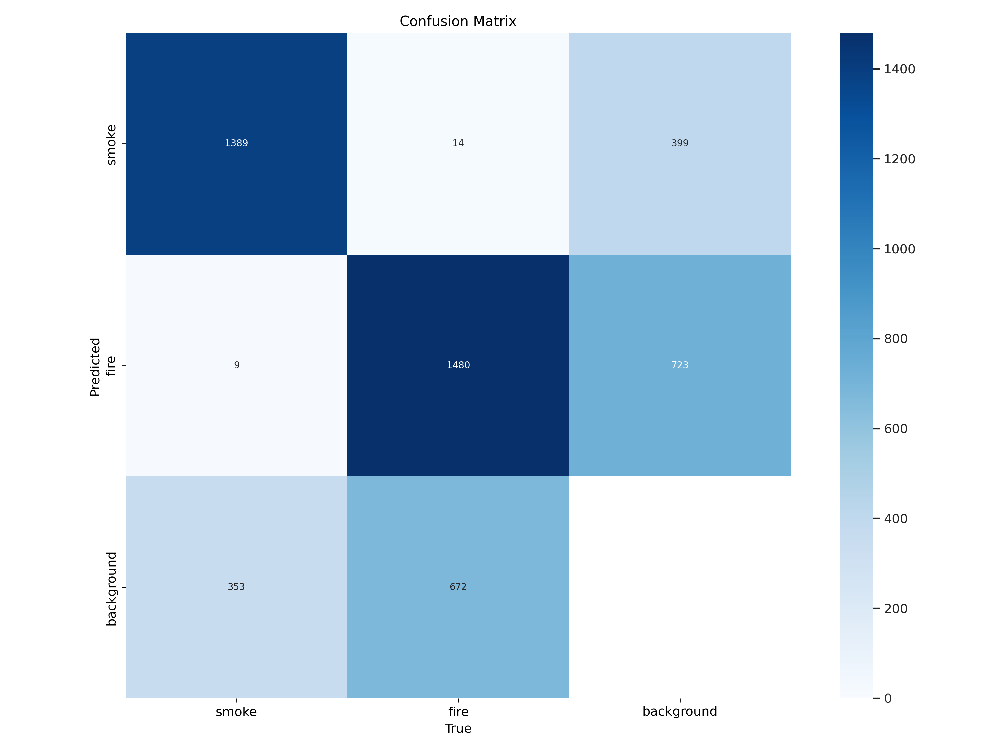

In [14]:
Image.open(f"runs/detect/train/confusion_matrix.png")

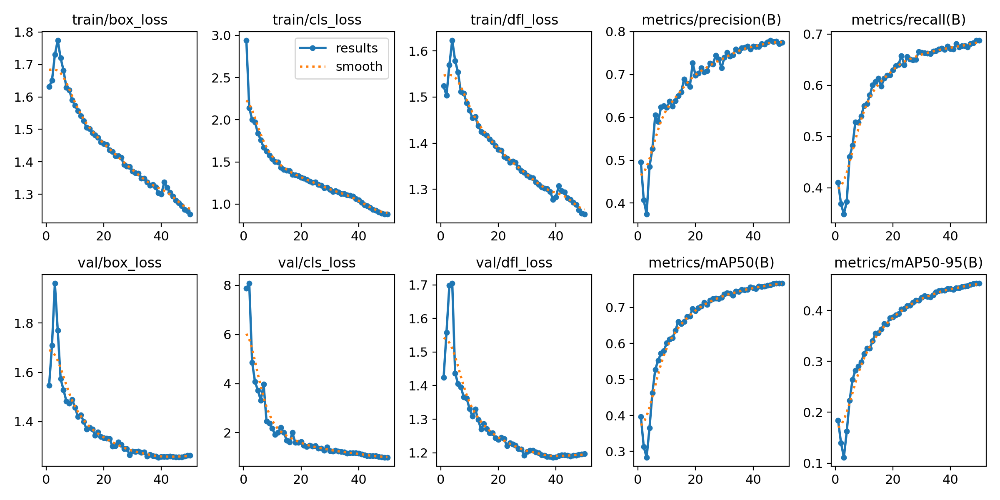

In [15]:
Image.open(f"runs/detect/train/results.png")

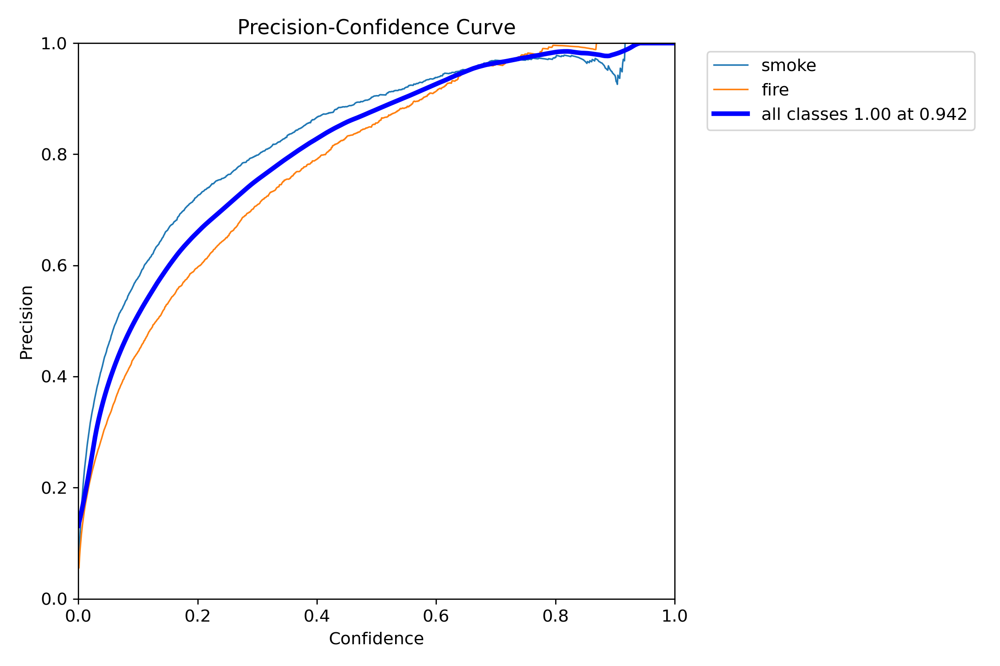

In [16]:
Image.open(f"runs/detect/train/P_curve.png")

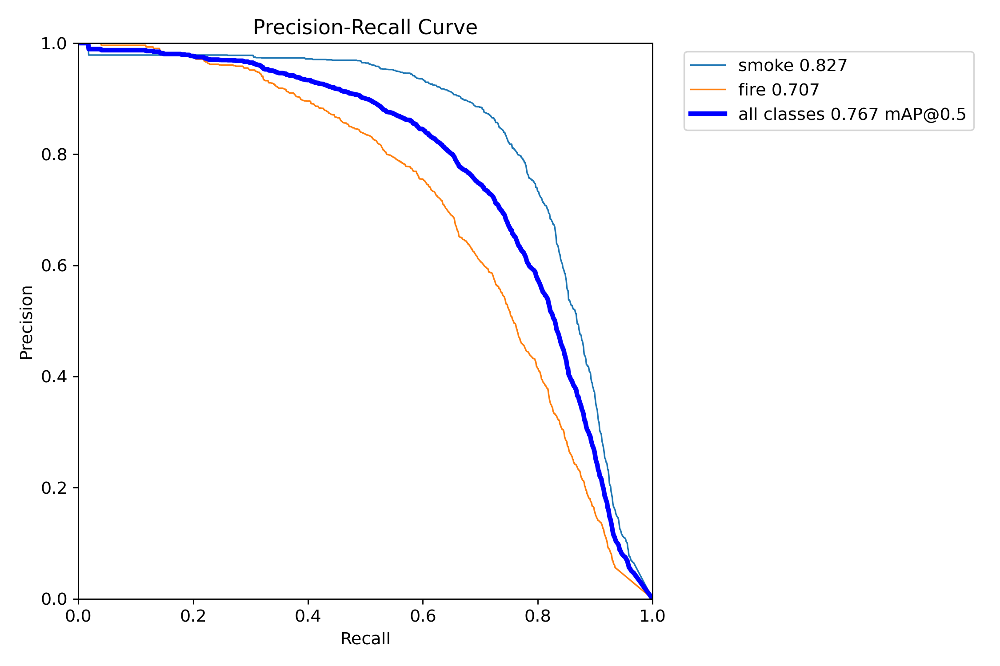

In [17]:
Image.open(f"runs/detect/train/PR_curve.png")

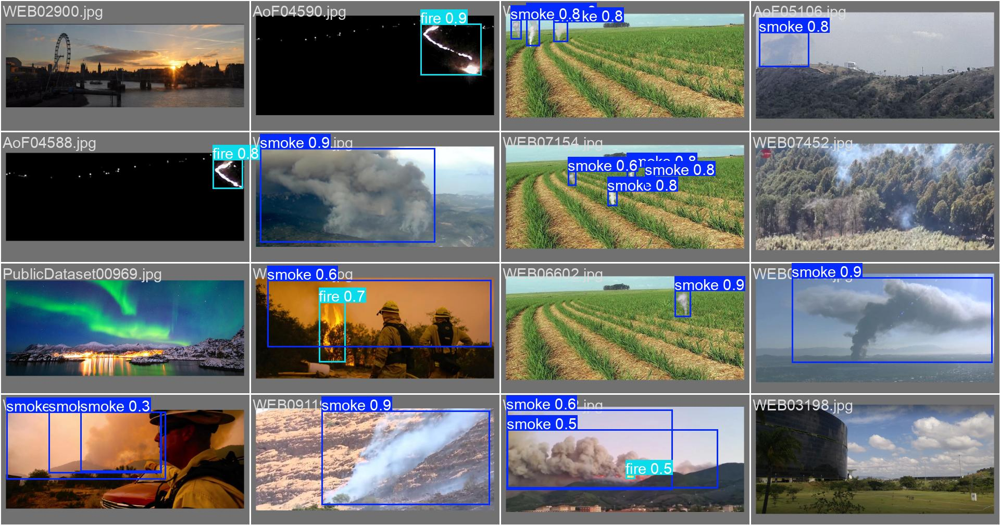

In [18]:
Image.open(f"runs/detect/train/val_batch0_pred.jpg")

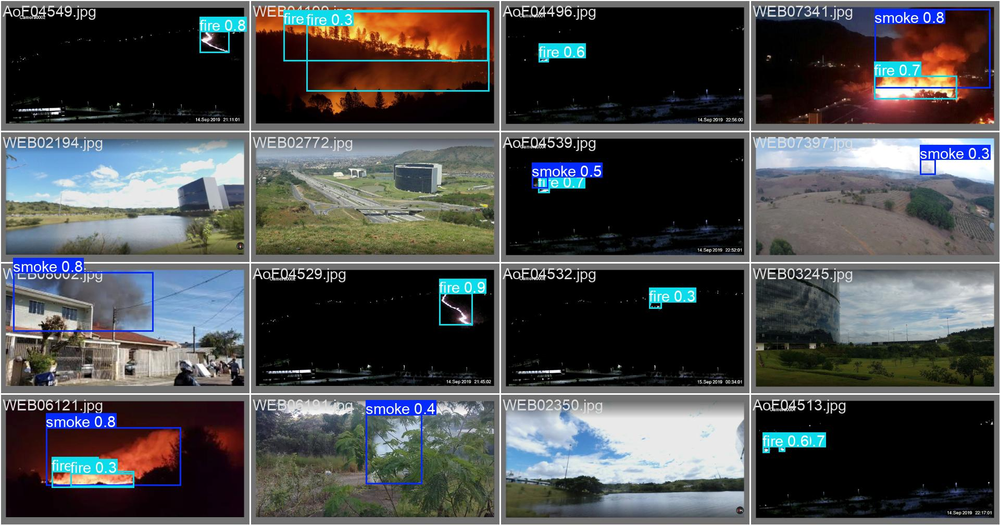

In [19]:
Image.open(f"runs/detect/train/val_batch1_pred.jpg")

## Step 6: Real-Time Detection

In [25]:
detection_results = model(f"{root}/data/test/images", device=0, verbose=False)


WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs



In [27]:
print(detection_results[0])


ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'smoke', 1: 'fire'}
obb: None
orig_img: array([[[227, 202, 192],
        [226, 201, 191],
        [224, 199, 189],
        ...,
        [215, 187, 180],
        [219, 191, 184],
        [215, 187, 180]],

       [[224, 199, 189],
        [226, 201, 191],
        [226, 201, 191],
        ...,
        [210, 182, 175],
        [216, 188, 181],
        [215, 187, 180]],

       [[221, 196, 186],
        [227, 202, 192],
        [229, 204, 194],
        ...,
        [208, 180, 173],
        [215, 187, 180],
        [217, 189, 182]],

       ...,

       [[ 22,  27,  30],
        [ 23,  28,  31],
        [ 24,  29,  32],
        ...,
        [ 51,  39,  29],
        [ 19,   7,   0],
        [ 97,  85,  73]],

       [[ 24,  31,  34],
        [ 25,  32,  35],
        [ 25,  32,  35],
        ...,
        [194, 182, 170],
        [174, 162, 150],
   

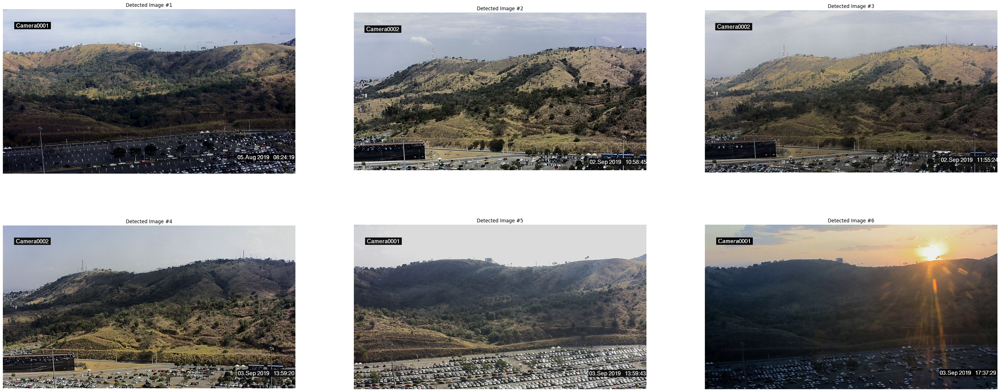

In [30]:
def visualize_detections(results, num_images, row_count):
    column_count = num_images // row_count
    plt.figure(figsize=(45, 18))

    for index, result in enumerate(results):
        if index == num_images:
            break
        plt.subplot(row_count, column_count, index + 1)
        
        # Load the original image
        rgb_image = np.array(Image.open(result.path).convert("RGB"))

        # Extract bounding boxes
        for bbox in result.boxes:
            x1, y1, x2, y2 = bbox.xyxy[0] 
            confidence = bbox.conf[0]  # Confidence score
            label = int(bbox.cls[0])  # Class ID
            
            # Display only confident detections
            if confidence > 0.3:
                cv2.rectangle(rgb_image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 10)
                cv2.putText(rgb_image, 
                            f"{result.names[label]} {confidence:.2f}", 
                            (int(x1), int(y1) - 10), 
                            cv2.FONT_HERSHEY_SIMPLEX, 
                            2, (0, 255, 0), 4)

        plt.imshow(rgb_image)
        plt.title(f"Detected Image #{index + 1}")
        plt.axis("off")

visualize_detections(results=detection_results, num_images=6, row_count=2)